# Introduction to Recommender Systems
Netflix, YouTube, Spotify, Swiggy, etc, are all examples of recommendation systems. Recommendation system is an ML technique where the system reads into certain user attributes, and on the basis of that predict the kind of content that a user would like, and make recommendations accordingly.

# Market Basket Analysis
Consider stores like Big Bazaar, SPAR, Reliance Fresh, Walmart, 7Eleven, etc. The layout of these stores is designed in a certain fashion. For example, the billing counter is placed in a certain location within the store, the various dedicated shelves for different items (confectionary, milk, fruits, vegetables, etc) are placed in a certain location.

Why are these stores designed in this way? The likelihood of items occurring is what is kept in mind while designing these stores. Meaning, what other stuff a customer might also buy, if he/ she buys a certain product.

Such kinds of systems are called recommender systems, where user transactions are analyzed, and then recommendations on what other things a user may/ can buy are made.

Consider Google search, when a user clicks on the search bar, a drop down list with recommendations on what the trending searches are is shown. These recommendations list is account specific. All of these are examples of personalizations, where personalization means, the user behavior is analyzed, and recommendations are made accordingly. Market basket analysis is the simplest kind of recommendation system.

Consider a store like Big Bazaar, and consider 1 user, Eshaan, for example. The following are the transactions he made,

| dates | items |
| :-: | :-: |
| 01-03-2024 | Bread, Milk, Eggs, Butter |
| 03-03-2024 | Milk, Bread, Grapes, Yogurt |
| 05-03-2024 | Milk, Bread, Buttermilk, Lemon |
| 05-03-2024 | Peanuts, Onion, Pringles |

Where, 1 transaction = the customer enters store + the customer searched for an item and added it to the cart + customer made payment + customer exited the store.

In a nutshell, the past purchase behavior of the customer is considered, and analyzed across all the transactions, and the things that customer or customers are buying together are understood. For example, in the analysis, it is found that if milk and bread are bought together, then it makes sense to place milk and bread in the same shelf or a shelf close to the other. In a different scenario, if it is found that toothpaste and toothbrush are bought together, then it makes sense to place them both close by. In addition to toothpaste and toothbrush, all the grooming products can be placed together.

This is a high level understanding of what market basket analysis helps in achieving.

# Stock Keeping Unit (SKU)
Stock keeping unit gives information about the kind of commodity that are in the stock. Meaning, if there are Digestive Biscuits, then that is 1 SKU, or if there is Breakfast Tea, then that is 1 SKU. During billing, the item is scanned under a bar code reader to fetch the price of that item. SKU in simple terms terms gives information about weather an item or a product is in the stock or not. Each item is 1 SKU. In a local store there could be some 10 to 20 thousand SKUs. In a mega store like, Amazon, there could be a million SKUs. In 1 transaction, a user could buy 10 - 20 SKUs, or distinct products.

Consider that there are m transactions in a month,
- $T_1 = {a_1, a_2, a_5}$,
- $T_2 = {a_3, a_7, a_n}$,
- ...
- $Tm = {a_4, a_8, a_2, a_5, a_i}$

Where, $a_i$ = SKU.

Say that there are D items in total, which is the total number of SKUs. Meaning, if there are n distinct products, it means D = {1, 2, 3, ..., n}, where n could be a million.

So every time a transaction is done it is a subset of this, i.e., set D. Meaning, $T_i$ is a subset of D.

Consider an example where there are n items, $T_1 = {a_1, a_2, a_3}$. $T_1$ is a subset of D.

Once the information of all the transactions are available, the items that people bought together can be grouped (groups are also called item sets). For example,
- Eshaan = {"Milk", "Butter", "Bread"}
- Raeesa = {"Milk", "Bread", "Banana", "Honey"}
- Lokesh = {"Flat Rice", "Peanuts", "Banana"}
- Venkatesh = {"Milk", "Bread", "Egg"}

One observation from the above examples is that, whenever a person bought Milk, they also bought Bread. This is an outcome of market basket analysis.

According to markey basket analysis, each transaction is basket, i.e., $T_1$, $T_2$, $T_3$, ..., $T_n$, and if they are analyzed, and patterns of what items are bought together are observed, then directions can be given to the superstore on how the items should be placed. Together, or in close proximity to each other.

According to a Walmart study, people who bought Beer, also bought Diapers together.

# Problem Statement
A retail store wants to increase sales, and customer satisfaction through their purchase journey. The task is to use the data to determine the products that are often purchased together. With this the store is hoping to,
- Optimize product placement.
- Offer special deals, and create new product bundles to encourage further sales of these combinations.

In [1]:
# importing packages
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import warnings

In [2]:
# configuring the notebook
pd.set_option("display.max_columns", None)
sns.set_theme(style = "whitegrid")
warnings.filterwarnings("ignore")
plt.rcParams['figure.figsize'] = (20, 5)

In [3]:
df = pd.read_csv("Online_Retail.csv")
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,01/12/10 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,01/12/10 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,01/12/10 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,01/12/10 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,01/12/10 8:26,3.39,17850.0,United Kingdom


- InvoiceNo is the bill number, each InvoiceNo represents 1 transaction, and each transaction can have multiple SKUs.
- StockCode is similar to SKU.
- Data will remain unique at InvoiceNo and StockCode level.
- The objective here is to analyze the entire data, and find some SKUs which are being purchased together.

Whenever market basket analysis is done, quantity is not considered. Meaning, if a person is buying 6 Beers and 1 Diaper, and if the other person is buying 1 Beer and 2 Diapers, the value for both is equal. This is because, the objective is to find the items which are purchased together. The quantity of items sold is therefore not important.

# How is the Data Analyzed? What kind of Data Manipulation should be carried out for Market Basket Analysis?

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    541909 non-null  object 
 1   StockCode    541909 non-null  object 
 2   Description  540455 non-null  object 
 3   Quantity     541909 non-null  int64  
 4   InvoiceDate  541909 non-null  object 
 5   UnitPrice    541909 non-null  float64
 6   CustomerID   406829 non-null  float64
 7   Country      541909 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 33.1+ MB


In the dataset, if a transaction is done with 10 items, then there would be 10 rows of InvoiceNo, each row contaning 1 SKU.

The goal is to find out,
- how many unique transactions there are? and,
- how many unique customers are there in the dataset?

In [5]:
unique_invoice_numbers = df["InvoiceNo"].unique()
unique_invoice_numbers

array(['536365', '536366', '536367', ..., '581585', '581586', '581587'],
      dtype=object)

In [6]:
unique_customers = df["CustomerID"].unique()
unique_customers

array([17850., 13047., 12583., ..., 13298., 14569., 12713.])

In [7]:
# summary of the numerical columns
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


The quantity and the unit price have a negative, why? This is because there items in the dataset which have been returned. The returned items do not help in generating any meaningful insights. Therefore, it is OK to go ahead and drop the rows which have a negative value in the "Quantity" and the "UnitPrice" column.

In [8]:
df = df[df["Quantity"] >= 0]
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 531285 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    531285 non-null  object 
 1   StockCode    531285 non-null  object 
 2   Description  530693 non-null  object 
 3   Quantity     531285 non-null  int64  
 4   InvoiceDate  531285 non-null  object 
 5   UnitPrice    531285 non-null  float64
 6   CustomerID   397924 non-null  float64
 7   Country      531285 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 36.5+ MB


In [9]:
# dropping all the rows that do not have invoice numbers and remove the credit transactions (rows where InvoiceNo contains "C")
df.dropna(axis = 0, subset = ["InvoiceNo"], inplace = True)
df["InvoiceNo"] = df["InvoiceNo"].astype("str")
df = df[~df["InvoiceNo"].str.contains("C")]
df.info()

<class 'pandas.core.frame.DataFrame'>
Index: 531285 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype  
---  ------       --------------   -----  
 0   InvoiceNo    531285 non-null  object 
 1   StockCode    531285 non-null  object 
 2   Description  530693 non-null  object 
 3   Quantity     531285 non-null  int64  
 4   InvoiceDate  531285 non-null  object 
 5   UnitPrice    531285 non-null  float64
 6   CustomerID   397924 non-null  float64
 7   Country      531285 non-null  object 
dtypes: float64(2), int64(1), object(5)
memory usage: 36.5+ MB


In [10]:
# finding the value_counts of the "Country" column
df["Country"].value_counts()

Country
United Kingdom          486286
Germany                   9042
France                    8408
EIRE                      7894
Spain                     2485
Netherlands               2363
Belgium                   2031
Switzerland               1967
Portugal                  1501
Australia                 1185
Norway                    1072
Italy                      758
Channel Islands            748
Finland                    685
Cyprus                     614
Sweden                     451
Unspecified                446
Austria                    398
Denmark                    380
Poland                     330
Japan                      321
Israel                     295
Hong Kong                  284
Singapore                  222
Iceland                    182
USA                        179
Canada                     151
Greece                     145
Malta                      112
United Arab Emirates        68
European Community          60
RSA                         58


Market basket for each country might behave differently. Since majority of the data is from the UK, for the sake of further analysis, only that is considered.

Also, data transformation is performed such that a sparse matrix is created, where all the rows will be InvoiceNo, and all the columns will be SKUs. Say if there are m transactions,

| InvoiceNo | bread | butter | egg |
| :-: | :-: | :-: | :-: |
| $a_1$ | | | |
| $a_2$ | | | |
| $a_3$ | | | |
| . | | | |
| . | | | |
| . | | | |
| $a_m$ | | | |

For each invoice number, the items that were bought by that InvoiceNo will be checked, and marked as 1 if bought, and 0 if the item is not bought. For example,

| InvoiceNo | bread | butter | egg |
| :-: | :-: | :-: | :-: |
| $a_1$ | 1 | 0 | 0 |
| $a_2$ | 1 | 1 | 1 |
| $a_3$ | 0 | 0 | 1 |
| . | | | |
| . | | | |
| . | | | |
| $a_m$ | 1 | 0 | 1 |

This above is called as a sparse matrix. A sparse matrix is where the majority of the values are 0s.

In [11]:
data = (df[df["Country"] == "United Kingdom"].groupby(["InvoiceNo", "Description"])["Quantity"].sum().unstack().reset_index().fillna(0).set_index("InvoiceNo"))
data.head()

Description   4 PURPLE FLOCK DINNER CANDLES   50'S CHRISTMAS GIFT BAG LARGE  \
InvoiceNo                                                                     
536365                                  0.0                             0.0   
536366                                  0.0                             0.0   
536367                                  0.0                             0.0   
536368                                  0.0                             0.0   
536369                                  0.0                             0.0   

Description   DOLLY GIRL BEAKER   I LOVE LONDON MINI BACKPACK  \
InvoiceNo                                                       
536365                      0.0                           0.0   
536366                      0.0                           0.0   
536367                      0.0                           0.0   
536368                      0.0                           0.0   
536369                      0.0                           0.0   

Description   NINE DRAWER OFFICE TIDY   OVAL WALL MIRROR DIAMANTE   \
InvoiceNo                                                            
536365                            0.0                          0.0   
536366                            0.0                          0.0   
536367                            0.0                          0.0   
536368                            0.0                          0.0   
536369                            0.0                          0.0   

Description   RED SPOT GIFT BAG LARGE   SET 2 TEA TOWELS I LOVE LONDON   \
InvoiceNo                                                                 
536365                            0.0                               0.0   
536366                            0.0                               0.0   
536367                            0.0                               0.0   
536368                            0.0                               0.0   
536369                            0.0                               0.0   

Description   SPACEBOY BABY GIFT SET   TOADSTOOL BEDSIDE LIGHT   \
InvoiceNo                                                         
536365                           0.0                        0.0   
536366                           0.0                        0.0   
536367                           0.0                        0.0   
536368                           0.0                        0.0   
536369                           0.0                        0.0   

Description   TRELLIS COAT RACK  *Boombox Ipod Classic  \
InvoiceNo                                                
536365                      0.0                    0.0   
536366                      0.0                    0.0   
536367                      0.0                    0.0   
536368                      0.0                    0.0   
536369                      0.0                    0.0   

Description  *USB Office Mirror Ball  10 COLOUR SPACEBOY PEN  \
InvoiceNo                                                      
536365                           0.0                     0.0   
536366                           0.0                     0.0   
536367                           0.0                     0.0   
536368                           0.0                     0.0   
536369                           0.0                     0.0   

Description  12 COLOURED PARTY BALLOONS  12 DAISY PEGS IN WOOD BOX  \
InvoiceNo                                                            
536365                              0.0                        0.0   
536366                              0.0                        0.0   
536367                              0.0                        0.0   
536368                              0.0                        0.0   
536369                              0.0                        0.0   

Description  12 EGG HOUSE PAINTED WOOD  12 HANGING EGGS HAND PAINTED  \
InvoiceNo                                                              
536365      

In [12]:
# for any transaction if the quantity of an item is greater than or equal to 1 then it is encoded as 1 (bought), else 0 (not bought)
def encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

data = data.applymap(encode_units)
data

Description   4 PURPLE FLOCK DINNER CANDLES   50'S CHRISTMAS GIFT BAG LARGE  \
InvoiceNo                                                                     
536365                                    0                               0   
536366                                    0                               0   
536367                                    0                               0   
536368                                    0                               0   
536369                                    0                               0   
...                                     ...                             ...   
581585                                    0                               0   
581586                                    0                               0   
A563185                                   0                               0   
A563186                                   0                               0   
A563187                                   0                               0   

Description   DOLLY GIRL BEAKER   I LOVE LONDON MINI BACKPACK  \
InvoiceNo                                                       
536365                        0                             0   
536366                        0                             0   
536367                        0                             0   
536368                        0                             0   
536369                        0                             0   
...                         ...                           ...   
581585                        0                             0   
581586                        0                             0   
A563185                       0                             0   
A563186                       0                             0   
A563187                       0                             0   

Description   NINE DRAWER OFFICE TIDY   OVAL WALL MIRROR DIAMANTE   \
InvoiceNo                                                            
536365                              0                            0   
536366                              0                            0   
536367                              0                            0   
536368                              0                            0   
536369                              0                            0   
...                               ...                          ...   
581585                              0                            0   
581586                              0                            0   
A563185                             0                            0   
A563186                             0                            0   
A563187                             0                            0   

Description   RED SPOT GIFT BAG LARGE   SET 2 TEA TOWELS I LOVE LONDON   \
InvoiceNo                                                                 
536365                              0                                 0   
536366                              0                                 0   
536367                              0                                 0   
536368                              0                                 0   
536369                              0                                 0   
...                               ...                               ...   
581585                              0                                 0   
581586                              0                                 0   
A563185                             0                                 0   
A563186                             0                                 0   
A563187                             0                                 0   

Description   SPACEBOY BABY GIFT SET   TOADSTOOL BEDSIDE LIGHT   \
InvoiceNo                                                         
536365                             0                          0   
536366                             0  

Since the goal is to find out the frequently occurring items, all the transactions where only one product is bought is removed. Also, the association between 2 or more items that are bought together according to historic data is found.

In [13]:
data = data[(data > 0).sum(axis = 1) >= 2]
data

Description   4 PURPLE FLOCK DINNER CANDLES   50'S CHRISTMAS GIFT BAG LARGE  \
InvoiceNo                                                                     
536365                                    0                               0   
536366                                    0                               0   
536367                                    0                               0   
536368                                    0                               0   
536372                                    0                               0   
...                                     ...                             ...   
581582                                    0                               0   
581583                                    0                               0   
581584                                    0                               0   
581585                                    0                               0   
581586                                    0                               0   

Description   DOLLY GIRL BEAKER   I LOVE LONDON MINI BACKPACK  \
InvoiceNo                                                       
536365                        0                             0   
536366                        0                             0   
536367                        0                             0   
536368                        0                             0   
536372                        0                             0   
...                         ...                           ...   
581582                        0                             0   
581583                        0                             0   
581584                        0                             0   
581585                        0                             0   
581586                        0                             0   

Description   NINE DRAWER OFFICE TIDY   OVAL WALL MIRROR DIAMANTE   \
InvoiceNo                                                            
536365                              0                            0   
536366                              0                            0   
536367                              0                            0   
536368                              0                            0   
536372                              0                            0   
...                               ...                          ...   
581582                              0                            0   
581583                              0                            0   
581584                              0                            0   
581585                              0                            0   
581586                              0                            0   

Description   RED SPOT GIFT BAG LARGE   SET 2 TEA TOWELS I LOVE LONDON   \
InvoiceNo                                                                 
536365                              0                                 0   
536366                              0                                 0   
536367                              0                                 0   
536368                              0                                 0   
536372                              0                                 0   
...                               ...                               ...   
581582                              0                                 0   
581583                              0                                 0   
581584                              0                                 0   
581585                              0                                 0   
581586                              0                                 0   

Description   SPACEBOY BABY GIFT SET   TOADSTOOL BEDSIDE LIGHT   \
InvoiceNo                                                         
536365                             0                          0   
536366                             0  

The dataset has now been transformed according to the need.

According to the above observation, there are 16539 transactions where more than 1 items were bought. That is about 91% of the original data (refer cell number = [14] in the notebook).

# Analyzing the Items Sold Together - Apriori Algorithm
Consider that a store is being run where there are 3 items sold. There are 6 total possible combinations in which they can be sold,
1. {Milk}
2. {Egg}
3. {Bread}
4. {Milk, Egg}
5. {Milk, Bread}
6. {Bread, Egg}
7. {Milk, Egg, Bread}
8. {}

In a nutshell, if there are n items in a store, then the customer has a choice of $2^n$ transactions.

If there are n number of items, and m number of transaction, then the total number of possible transactions = $(2^n) * m$.

Consider the case of Walmart, say that there are 1 million items, and there are 10 transactions per month. The total possible transactions = $(2^{10^6}) * (10^7)$.

The time complexity of this would be super high. Therefore a term called threshold support is used. According to threshold support, if there are n items, then only k items will be considered.

Consider Milk and Bread for example. Only items which have been sold for 10% of the times are considered. Meaning, if there are 1000 transactions, and if Milk does not appear in 100 transactions at least, then Milk will not be considered.

Now consider another example where a store is being run with 4 items. The number of possible combinations in which these items can be bought = $2^4$ = 16. The possible combinations are,
- {1}, {2}, {3}, {4}, {1, 2}, {1, 3}, {1, 4}, {2, 3}, {2, 4}, {3, 4}, {1, 2, 3}, {1, 3, 4}, {2, 3, 4}, {1, 2, 3, 4}, {}

Say that the threshold is 100. Meaning, if a set is not sold for 100 times, it will not be considered.

Consider hypothetically that there are 500 transactions. The question is, out of theses 500 transactions how many times is 1 sold (1 could be sold alone, or 1 could be sold in a group with other items)? If 1 is sold as {1}, {1, 2}, {1, 2, 3}, then 1 is counted to be sold for 3 times.

If 1 is sold for 110 times, then 1 should be considered. If 4 is sold only for 50 times, then it is not considered for market basket analysis. This also implies that if 4 is sold along with 1, then that combination is not considered as well. The same is the case with all other combinations which have 4 (they are not considered).

Next consider the combination {1, 2}, the number of times 1 and 2 are bought together is checked. If it is below the threshold then it is dropped. The same is repeated for all other combinations as well. Only the combinations which are above the threshold are kept for analysis, and the rest are discarded. This algorithm for market basket analysis is a quicker way. Else, the algorithm will run for $(2^n) * m$ times, which of course requires a lot of computation power. The algorithm used for market basket analysis is called as Apriori algorithm. This is one of the earliest algorithms developed in 1994 - 1995.

# Applications of Market Basket Analysis
1. Bio-informatics: It is used while analyzing a lot of proteins, specifically while analyzing the chemical components in the proteins which occur together.
2. Pharma/ Medical: It is used while experimenting multiple combinations of medicines to cure a particular type of illness.

# Implementation of Market Basket Analysis

In [14]:
# importing the algorithm from the module
from mlxtend.frequent_patterns import apriori

# fitting the model
# setting min_support = 0.03 (support threshold value = 3%)
frequent_itemsets_plus = apriori(data, min_support = 0.03, use_colnames = True).sort_values("support", ascending = False).reset_index(drop = True)
frequent_itemsets_plus["length"] = frequent_itemsets_plus["itemsets"].apply(lambda x: len(x))
frequent_itemsets_plus

/Library/Frameworks/Python.framework/Versions/3.11/lib/python3.11/site-packages/mlxtend/frequent_patterns/fpcommon.py:109: DeprecationWarning: DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type
  warnings.warn(


,support,itemsets,length
0,0.129875,(WHITE HANGING HEART T-LIGHT HOLDER),1
1,0.116331,(JUMBO BAG RED RETROSPOT),1
2,0.100671,(REGENCY CAKESTAND 3 TIER),1
3,0.095471,(PARTY BUNTING),1
4,0.084165,(LUNCH BAG RED RETROSPOT),1
...,...,...,...
172,0.030473,(CHRISTMAS CRAFT LITTLE FRIENDS),1
173,0.030473,(CREAM HEART CARD HOLDER),1
174,0.030413,"(LUNCH BAG BLACK SKULL., LUNCH BAG CARS BLUE)",2
175,0.030292,"(LUNCH BAG RED RETROSPOT, LUNCH BAG SPACEBOY D...",2


# Association Rules
Consider that, D = 1, 2, ..., n (D is the set of all items). Let x = {1, 2, 3}, y = {4, 6}.

When there is only 1 item in the item set, there is no association, since it is not paired with anything else. This is contrary to the case where there is a combination like {Bread, Eggs}, and the support for this is 13%. Meaning, there are 13% cases where Bread and Eggs are bought together. By extension, if a user buys Bread, then there is 13% chance that he/ she will buy eggs as well.

If Bread is bought 18% of the times, and Bread and Eggs are bought 13% of the times, then the probability that Eggs are bought after Bread is bought = 13/ 18. The reverse of this case does not hold. Meaning, it is incorrect to state that if Eggs are bought, then Bread is bought.

To sum up, whenever a pair of item is found, {a, b}. It is correct to state that "b" is bought, when "a" is bought. The reverse of this is not true. "a" here is called antecedant, and "b" is called consequent.

Association rules are an outcome of Apriori algorithm.

# Matrices to Understand the Association
So far, the only matrix seen is called support, but to understand market basket analysis and how thing are related, there are multiple matrices that help in understanding this.

A method called association_rules(), which has a bunch of matrice which help in understanding the relationship between 2 items in a market basket. The matrices are,

### Antecedants
Antecedant is the first item bought in a pair or item support.

### Consequents
Consequent is the second item bought in a pair or item support. If antecedant is bought, then consequent will be bought.

### Antecedant Support
Say that antecedant is represented as X, and consequent as Y.

$\text{Antecedant Support} = \frac{\text{Number of Times X Occurs}}{\text{Total Transactions}}$

### Consequent Support
Say that antecedant is represented as X, and consequent as Y.

$\text{Consequent Support} = \frac{\text{Number of Times Y Occurs}}{\text{Total Transactions}}$

### Support
Say that antecedant is represented as X, and consequent as Y.

$Support = \frac{\text{Number of Times the Pair Occurs}}{\text{Total Transactions}} = \frac{X \cap Y}{N}$

Where,
- $X \cap Y$ = X and Y are bought together.

### Confidence
Conidence explains the probability of Y being bought, if X is bought.

$Confidence = \frac{\text{Number of Times the Pair Occurs}}{\text{Number of Times X Occurs}} = \frac{(X \cap Y)}{\text{Number of Times X Occurs}}$

### Lift
Consider that Milk is a popular product, and Bread is also a popular product. There is a possibility that purchse of Milk is not driving the sale of Bread, because anyways both of them are a popular product. Lift is used to understand such cases.

Consider that there are Green and Pink, it is observed that in 61% of cases, people buy Pink once they buy Green. If people have not bought Green, then how many times would they buy Pink? Independent probability is calculated to understand,

$Lift = \frac{X \cap Y}{X * Y}$

If Y is a very popular item, then the value of Y will be high. Then (X intersection Y) << Y. However, if Y is only popular due to X, then (X intersection Y) ≈ Y.

P(X intersection Y) is high, then every time X is bought, then there is a very high chance of Y being purchased. Then there is also a possibility that Y is also very popular. In general the probability of Y being bought is very high. Then whatever correlation that is seen is due to random chance.

Hence a new metric called lift is devised,

Lift = P(X intersection Y)/ P(X) * P(Y)

$Lift = \frac{P(X \cap Y)}{P(X) * P(Y)}$

If Y is very popular, the P(X intersection Y) << P(Y). However, if Y is only popular with X, then P(X intersection Y) ≈ P(Y).

Where,
- $P(X \cap Y)$ = Support of X and Y.

Therefore,

$Lift = \frac{Support(X \cap Y)}{Support(X) * Support(Y)}$

- If Lift > 1, it is indicative of a positive correlation.
- If Lift = 1, it is indicative of no correlation.
- If Lift < 1, it is indicative of a negative correlation.

### Leverage
Leverage, like Lift, is also constructed using Support. This is very similar to Lift.

The Leverage of "if X then Y", i.e., (X -> Y) is calculated as,

$Leverage(X -> Y) = Support(X \cap Y) - (Support(X) * Support(Y))$

What is the advantage of using Leverage over Lift values?
- Leverage is easier to interpret.
- Leverage value lies in the range of -1 to +1, where as, Lift value ranges from 0 to infinity.

### Conviction
Conviction is calculated as the ratio of expected frequency that X occurs without Y, if X and Y were independent divided by the observed frequency of incorrect prediction.

$Conviction(X -> Y) = \frac{(1 - S(Y))}{(1 - C(X -> Y))}$

NOTE: A high value means that the consequent depends strongly on the antecedant.

In [15]:
from mlxtend.frequent_patterns import association_rules

association_rules = association_rules(frequent_itemsets_plus, metric = "lift", min_threshold = 1).sort_values("lift", ascending = False).reset_index(drop = True)
association_rules.head(5)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction,zhangs_metric
0,(GREEN REGENCY TEACUP AND SAUCER),(PINK REGENCY TEACUP AND SAUCER),0.056473,0.042264,0.034887,0.617773,14.617093,0.032500,2.505674,0.987345
1,(PINK REGENCY TEACUP AND SAUCER),(GREEN REGENCY TEACUP AND SAUCER),0.042264,0.056473,0.034887,0.825465,14.617093,0.032500,5.405948,0.972697
2,(PINK REGENCY TEACUP AND SAUCER),(ROSES REGENCY TEACUP AND SAUCER ),0.042264,0.057682,0.033013,0.781116,13.541798,0.030575,4.305101,0.967025
3,(ROSES REGENCY TEACUP AND SAUCER ),(PINK REGENCY TEACUP AND SAUCER),0.057682,0.042264,0.033013,0.572327,13.541798,0.030575,2.239413,0.982847
4,(GARDENERS KNEELING PAD KEEP CALM ),(GARDENERS KNEELING PAD CUP OF TEA ),0.054235,0.045287,0.032711,0.603122,13.317793,0.030254,2.405555,0.977952


# How to Draw Data Conclusions from these Association Rules?
It is observed that (GREEN REGENCY TEACUP AND SAUCER) and (PINK REGENCY TEACUP AND SAUCER) are items that have the highest association each other since these 2 items have the highest Lift values, i.e., 14.6,
- This tells that PINK REGENCY TEACUP AND SAUCER is 14.6 times more likely to be bought by the customers who buy GREEN REGENCY TEACUP AND SAUCER compared to the default likelihood sale of PINK REGENCY TEACUP AND SAUCER. Since the antecedant support < consequent support the rule that applies is {GREEN REGENCY TEACUP AND SAUCER -> PINK REGENCY TEACUP AND SAUCER}.
- This means that a customer has a higher tendency to buy PINK REGENCY TEACUP AND SAUCER after they biy GREEN REGENCY TEACUP AND SAUCER. Not the other way around. The confidence level for the rule is 0.6177 which shows that out of all the transactions that contain both GREEN REGENCY TEACUP AND SAUCER, ~62% contain PINK REGENCY TEACUP AND SAUCER too.
- This could be very valuable information, because this gives awareness about which products should be put on discounts. Meaning, PINK REGENCY TEACUP AND SAUCER can be discounted if a customer buys GREEN REGENCY TEACUP AND SAUCER.

Similarly, other business conclusions can be drawn from these association rules, which may lead to increase in revenue.

# What Business Strategy can be Followed Based on these Findings?
- Item Placements: Two products could be places together so that they are easily accessibile.
- Product Bundling: These two products could be bundled together and the product bundle could be sold at a discounted price.
- Customer Recommendation and Discounts: PINK REGENCY TEACUP AND SAUCER could be placed at the cashier, and every time a customer buys a GREEN REGENCY TEACUP AND SAUCER, the PINK REGENCY TEACUP AND SAUCER can to recommended to them at a discounted price.

# What is a Recommendation System/ Engine?
A recommender system predicts ratings a user might give to a specific item. These predictions will be ranked and returned back to the user as recommendations. The goal of a good recommender engine is to hook the user to the platform. There are many applications that make use of recommender engines. For example,
- Netflix
- Amazon
- YouTube
- Disney + Hotstar

The recommender engine/ systems do not have a bias of their own, the developer of the recommendation/ recommender system can add a bias or objective. But at the end of it all, these systems recommend items purely based on what a user would want to see.

Sometimes, although rarely, if an item shows, that otherwise was not supposed to be recommended, it means that the user has interacted with the platform in such a way that it has resulted in that item being shown on the user's feed.

It is impossible to show tens of thousands of products listed on the e-commerce website on the user's home feed. Therefore, it became important to recommend only those products that a user would be interested in. A few ways in which this problem could be tackled are,
- Similarity Based Algorithm: The idea behind similarity based algorithm is that, if a user liked a particular item, the other products similar to the one that was liked are recommended.
- Content Based Algorithm: Whenever a user clicks on an item, the content/ features of that clicked item are analyzed. For example, music genre, cast, director etc, and other items which have similar features are also recommended.
- Collaborative Filtering: The content or the user behavior is not understood, recommendations thus made are made without understanding either of them.

The content based filtering is explained in the context of similarity, and so is collaborative filtering.

Collaborative filtering has a drawback which is that, it is a slow algorithm. Therefore, there ought to be better ways to work around this.

Back in 2007 to 2015, Netflix created a competition with a prize money of $1 million, where the participants were given an objective to improve on the recommendation system that existed back then. An implementation of Matrix Factorization won the competition. This shaped how the recommender systems worked for years to come. In 2015, NVIDIA created a computing machine called GPU, which gave rise to deep learning, today there are deep learning models for recommender systems.

# How does the Data look like in a Recommendation System? How is the Data Represented in a recommendation System?
Consider that there are n users,

Users = $U_i$ = [1, n]

Then there are items. For Spotify, items will be songs. For Amazon, the items will be products. For YouTubem the items will be videos.. Items are also called as Documents. Items are what will be recommended to the users. Consider that there are m items,

Items = $I_j$ = [1, m]

### Problem Statement - Task of a Recommender System
For a user i, the system has to generate a list of items that will be recommended to that user. The original item list can have a million items, but finally, a perfect item list has to be generated that will be recommended to that user i.

Most of the time when this data is analyzed, it is represented in a matrix format. This matrix is called as interaction matrix, which is of shape `nxm` (n rows, and m columns). Rach row represnts users $U_1$ to $U_n$, and each column represents the items from $I_1$ to $I_m$. The value in the cell will be the iteraction. Interaction can be, 
- did the user like the item?
- did the user purchase this item?
- what percentage of the movie/ video did the user watch? 

Meaning, the value can be a boolean, percentage, or a continuous value.

For all the items where there is no interaction, they will be treated as 0.

The iteraction matrix, represented by $A_{nxm}$, looks something like this,

interaction_matrix = 

| users | $I_1$ | $I_2$ | $I_3$ | . | . | . | $I_n$ |
| :-: | :-: | :-: | :-: | :-: | :-: | :-: | :-: |
| $U_1$ | . | . | . | . | . | . | . |
| $U_2$ | . | . | . | . | . | . | . |
| $U_3$ | . | . | . | . | . | . | . |
| . | . | . | . | . | . | . | . |
| . | . | . | . | . | . | . | . |
| . | . | . | . | . | . | . | . |
| $U_n$ | . | . | . | . | . | . | . |

Assuming that there are 1 billion users, and there are 100 million videos on a streaming application. The size of the matrix is 1 billion x 100 million, meaning, there will be $10^{17}$ cells in the matrix whose interaction will be 0.

A metric called sparsity, which is defined as,

$Sparsity = \frac{{Number of Non-Empty Cells}}{\text{Number of Empty Cells}}$

Consider that each and every one of the 1 billion users, on average has interacted with 1000 videos. The sparsity in this case is,

$Sparsity = \frac{1000000000 * 1000}{10^{17}} = \frac{10^{12}}{10{17}} = 10^{-5}$

Meaning $1$ in $10^5$ cells is a non empty cell.

Keep in mind that when a rating is present, that is, if a user likes an item, it is represented with a 1, and if a user does not like an item it is represented with a 0. Generally, for storing purpose, all the places where there is an absence of rating (missing value), it is stored as -1 or 0. But when these are stored as -1 or 0, that does not mean that the rating is known. For all the places where the rating is not known, it is better not to store a 0 in that cell. It is always better to store a missing rating with a different value, like np.nan.

Note that, what has never been shown, cannot be interacted with, and hence cannot be represented with a 0.

# Collaborative Filtering

### How can Items be Recommended to the Users if the Matrix $A_{nxm}$ is given?
Before dealing with problem, information about the users and the items from the matrix A has to be retrieved.

### How to Obtain User or Item Vector from Matrix A?
Recall that for text data, a bag of words (BoW) was created which worked as the features. Similarly, a vector of dimensions `mx1` can be created where each element would contain information if a user $U_i$ has bought or watched or shown interest in item j, such that j belongs to [1, m].

For cases where the user $U_i$ has not interacted with an Item $I_j$, a 0 can be used to represent such cases. This way user data can be stored and used. This essentially is the ith row of matrix A.

A similar a vector `nx1` can also be created that represents data for an item $I_j$, which would be the jth column of matrix A.

This way of using the given matrix A to form user and item vectors is known as Collaborative Filtering (CF) Recommendation Systems.

There are different approaches to implement collaborative filtering:
1. Item-Item Based Similarity
2. User-User Based Similarity

# Item-Item Based Similarity
The historical data about items bought or positively rated by the users $U_i$ is avaliable. Consider that a user has already bought item $I_{10}$ and $I_{12}$.

### What if an item $I_j$ is found which is similar to these already bought items?
Items with high similarity to items bought historically by the user $U_i$ can be found, as it is known that this user showed interest in such items. For example,
- If a Spotify user likes music by Lata Mangeshkar, then there is a high chance that, the user may like music by Asha Bhosle, Mohammed Rafi, etc.
- If a Netflix user likes Mission Impossible, then there is high chance that the user may like other similar action movies like John Wick, or Jason Bourne, etc.

In the example considered,
- The user $U_i$ likes $I_{10}$ and $I_{12}$.
- Items that are similar to $I_{10}$ and $I_{12}$ are found.
- If an item $I_k$ lies in both these sets, there are more chances that the user $U_i$ likes item $I_k$.

This is very similar to "Nearest Neighbor" based approach.

### How is similarity between items found?
Every $I_j$ is an n dimensional vector. It represents the ratings given to the item $I_j$ by all the n users. Cosine similarity is used to measure the similarity between a specific item say $I_{10}$ and the rest of the items. Based on this metric value, the items that are most similar to $I_{10}$ are recommended.

$\text{Similarity}(I_i, I_j) = \text{Cosine Similarity}(I_i, I_j) = \frac{I_i^T * I_j}{||I_i|| * ||I_j||} = S_{ij}$

### How are these similarity scores stored?
A similarity matrix is built with all the $S_{ij}$ values. Since the current conversation is about item-item similarity, the matrix is denoted as $S^i$. The $S^i$ matrix has the dimensions of `mxm`, and $S_{ij}^{i}$ represents how similar two items $I_i$ and $I_j$ are to each other. Larger the value of $S_{ij}^{i}$, more similar are the items $I_i$ and $I_j$ to each other.

This is know as Item-Item Similarity Based Collaborative Filtering Recommendation System. It was introduced in the year 1998 by Amazon.

Here the recommender engine compares the items that that are already positively rated by a user, with the items that the user did not rate and looks for similarities. Items similar to the positively rated ones will be recommended.

This is also one of the most basic ideas behind YouTube's recommendation system.

The dimensions of the item-item similarity matrix is `mxm`, and m is a very large number.

### Would the calculation of similarity matrix be a time consuming process?
Yes, it would be. Back in the day when this approach was used, Amazon carried out the computation of this during the non-active hours, or may be even on the weekends, so that when the user logs in, they readily get the recommendations based on this calculation.

# User-User Based Similarity
Consider a user $U_i$,

### What if a user $U_j$ which is similar to $U_i$ is found?
Since both the users are similar, the history of one user can be used to make content recommendations to the other user.

The vector with dimension `mx1` representing the user data for the ith user $U_i$, which was retrieved from the matrix A is already available, cosine similarity can be used to find the similarity between user $U_i$, and all the other users, to find the most similar users.

A similarity matrix $S^u$ is created in this case as well, where $S_{ij}^u$ represents how similar is the user $U_i$ to user $U_j$.

### How is this used to recommend items to the user $U_i$?
Consider that user $U_i$ has already bought items $I_{10}$ and $I_{18}$. Say that using cosine similarity, the following users with the following purchase history were found to be similar to $U_i$,
- $U_{10}$: $I_{10}, $I_{12}$, $I_{18}$, $I_{20}$
- $U_{26}$: $I_{10}, $I_{18}$, $I_{26}$, $I_{12}$
- $U_{58}$: $I_{18}, $I_{12}$

Using the frequency based approach, the item $I_{12}$ seems to be a very popular purchase among other similar users. Therefore, if a user $U_i$ has purchased $I_{10}$ and $I_{18}$, they can be recommended with $I_{12}$.

This technique where similar users are found is called User-User Similarity Based Collaborative Filtering.

This approach is also very similar to "Nearest Neighbor" based approach.

### What is the flaw with user-user based similarity approach?
One major problem with user-user based similarity is that the user preferences change over time. This can lead to bad recommendations. Hence, to prevent this item-item based similarity approach is preferred. Because, in contrast, the ratings on the given items do not change significantly over time.

### How to decide when to use user-user or item-item similarity approach?
When there are more number of users than items, i.e., n > m, and if the item ratings does not change much over time, after the initial period, then it is better to use item-item based similarity approach.

# Cold Start Problem with Collaborative Filtering

### What if a new user joins the platform?
When a new user $U_i$ joins the platform, there is no data regardng the ratings given by this user, and therefore the entire ith row in matrix A is empty. Meaning the entire user vector has no data, and therefore similar users cannot be found.

For every recommender system built using user-user based similarity approach, a user profile is built using the user's activities, and behaviors with the system. And recommendations are made based on the user's history only. If there is no historical data, then the user profile cannot be built, and therefore recommendations cannot be given to that user.

### What if a new item is added to the platform?
In this case again, because the historical data is not present, similar items cannot be found, and therefore recommendations cannot be made.

### What is a cold start problem?
Both these cases stated above are scenarios of a cold start problem. This arises where there is no data about new users/ items, which prevents from calculating similarity matrices and generating recommendations.

This problem arises due to 3 reasons,
- for new users
- for new items
- for new communities

In these cases, there isn't enough information to make good recommendations.

# Advantages and Disadvantages of Collaborative Filtering

### Advantages
- No domain knowledge necessary: There is no need of having domain knowledge, because the embeddings are automatically learned.
- Serendipty: The model can help users discover new interests. In isolation, the ML system may not know that the user is interested in a given item, but the model might still recommend it because similar users are interested in that item.
- The system does not need contextual features.

### Disadvantages
- Fails in the case of cold start.

# Content Based Recommendation System
Normally, there is no need to understand the users, or items while performing colloborative filtering. But whenever the cold start problem is encountered, it is important to understand both the users, and items.

### How to overcome the cold start problem in case there is a new user?
Consider that there is a new user, even though there is no information regarding this user's interactions with different items, there is other additional information about this new user, like,
- Location:
    - This can be used to get an idea of the items used or purchased by other users in that area.
    - Swiggy's recommender system can make an assumption that Idli and Dosa are more likely to be liked by a user residing in the Southern part of the country.
    - The location can be extracted from the user's IP address, or most platforms do ask the users for their location while signing up.
- Gender:
    - Useful in recommending clothes and accessories.
- Age
- Type of credit card:
    - This helps in extracting information like spending habits, credit limits, brand of credit card, etc.
- Kind of device being used to access the platform:
    - Deductions like, a iPhone user would have more spending power than a cheap Chinese smartphone user can be made with this information.

A new d'-dimensional vector that holds all of this data is created and then user-user similarity matrix is created using this, and then a recommender system is built using that.

This technique is called User-User Similarity Based Content Filtering Recommender Systems.

### How to overcome the cold start problem in case there is a new item?
Consider that there is a new item on say Amazon, though there is no data about user ratings, there still is additional information available like,
- Product description: This would potentially be stored as BoW.
- Price
- Category of product: Like electronics, clothing, sports, and so on.

A new d-dimensional vector that holds all of this data is created, and then item-item similarity matrix is created using this, and then a recommender system is built using that.

This technique is called Item-Item Similarity Based Content Filtering Recommender Systems.

A new item can be recommended to those users who bought similar items from the same categories until there is sufficient information. This additional information regarding the users, and items is called as metadata.

This process of finding user-user or item-item similarities using metadata to recommend items to users is called Content Based Recommendation System.

### Why is it called "Content Based"?
This is because the purchase data is not being used to find similarity, and instead the features extracted from, or provided in the content of the user, or item is being used to create the d-dimensional vector representing the metadata of the user, or item.

The point of content based filtering is that the content of both the users and items should be known.

### Advantages of Content Based Filtering
- Since the recommendations are specific to a user, the model does not need any data about other users. This makes it easier to scale to a large number of users.
- The model can capture the specific interests of a user, and can recommend niche items that very few other users are interested in.

### Disadvantages of Content Based Filtering
- Since the feature representation of the items are hand-engineered to some extent, this technique requires a lot of domain knowledge. Therefore, the model can only be as good as the hand engineered features.
- The model always recommends items related to the same categories, and never recommends anything from other categories.

# Is it Possible to Frame the Recommendation Problem as a Regression Task?
Yes. In a regression based approach, the recommendation problem is treated as a regression task where the goal is to predict user ratings direclty using user, and item features as input. Regression models like Linear Regression, Decision Trees, or Neural Networks can be used to model the relationship between user and item features and user ratings.

# Recommendation as a Regression/ Classification Problem
In content based filtering, metadata was used to create d-dimensional user and item vectors.

### Can these d-dimensional user and item vectors be used as features of a Regression/ Classification problem?
Say that a user $U_i$ gives a rating of 4 to an item $I_j$, i.e., $A_{ij}$ = 4.

Metadata can be used to obtain a feature vectors for users $U_i$, and for items $I_j$ of dimension d' and d respectively.

If the 2 feature vectors are concatenated, and a label $A_{ij}$ is assigned to them, which is the rating given by $U_i$ to $I_j$, the entry of the data that can be used for training a regression/ classification model is obtained. This way the training data can be formed from the entries of matrix A, that are non-empty.

Here, both, the given metadata, and the entries of matrix A, are used to train a regression/ classification model, and the ratings of a new pair of user, and item can be predicted, given their features. Therefore, this is a hybrid model of sorts.

### Is there any problem with this approach?
Conider that a new user is added, the cold start problem is not encountered, as the ratings of this new user for items can be predicted using the user's metadata. But in order to recommend the top 10 items, the rating for all the items have to be predicted. This is a problem because there may be as many as a million items on a platform (like Amazon). An operation like this obviously computationally expensive. Hence the model is not feasible.

# Matrix Factorization
Recall matrix factorization from Algebra, as per this concept, a number can be expressed as product of its factors, e.g. 6 = 2 * 3.

Consider the matrix A, which is of the dimension nxm. The above concept is used to decompose the matrix A as a product of 2 other matrices.

$A_{nxm} = B_{nxd} * C_{dxm}$

This is called as Matrix Factorization (MF), or Matrix Decomposition.

### Can the matrix A be decomposed as a product of 3 matrices?
Yes, just as 12 can be expressed as, 3 * 2 * 2, the matix A can be decomposed into 3 matrices instead of 2. The final dimensions, meaning, the product of 3 matrices when calcalted, should have the dimensions, `nxm`. As long as this condition is satisfied, the matrix A can be decomposed into as many factors as fancied.

Therefore, $A_{nxm} = B_{nxd} * C_{dxd'} * D_{d'xm}$

But in the context of recommendation systems, the matrix A is decomposed into 2 matrices only.

### How is the concept of MF relevant to recommendation systems?
Recall that the matrix A is a sparse matrix, meaning there are a lot of missing values. If this matrix could be approximately completed based on the values that are already available, then a rough idea can be drawn on how each user would rate each item. This would be very helpful in recommending new items to the users. 

This technique of utilizing the available value to complete the sparse matrix A is called as matrix factorization. There are tonnes of ways to slove the problem of matrix completion, one of the way of achieving this is by the process of matrix factorization.

### What is the underlying assumption behind matrix factorization in recommender systems?
The fundamental assumption of matrix fatorization based recommender system is that $A_{ij}$, i.e., the user $U_i$'s rating for an item $I_j$ can be decomposed as a dot product between a user vector $B_i$ and an item vector $C_j$. This idea of using matrix factorization for recommender systems was introduced around 2008-2009, during the Netflix prize competition.

### How to go about completing the matrix A using matrix factorization?
Consider matrix A, even though it is sparse and all of its values are not known, assume that the following decomposition is true,

$A_{nxm} = B_{nxd} * C_{dxm}^T$

Where,
- n = number of users
- m = number of items

C has the dimensions `mxd`, but in order to take a dot product, so that the dimensions match with those of B. This is known as interaction model.

### How can the value of a cell $A_{ij}$ be represented in terms of matrices B and C?
$A_{ij}$ can be obtained by taking a dot product of the ith row of matrix B and the jth row of matrix C.

Recall that in ML, a vector is a column vector. Therefore, $B_i$ and $C_j$ are obtained as the required column vectors respectively. In order to take a dot product a transpose of $B_i$ is taken.

$A_{{ij}_{1x1}} = B_{{i}_{1xd}}^T * C_{{j}_{dx1}}$

Notice that the original matrix B has a dimension of `nxd`, where n represents the number of users. Therefore, B can be interpreted to be a d-dimensional vector that represents user $U_i$. Similarly, $C_j$ can be interpreted to be a d-dimensional vector that represents item $I_j$.

$A_{ij}$ is obtained by the interaction (dot product) between $B_i$ and $C_j$ vectors, which represent the users $U_i$ and items $I_j$ respectively.

This is the assumption that was made in the beginning of MF.

NOTE: Multiplication in linear algebra is also known as "interaction", hence this model is called as the interaction model.

### How to find $B_i$ and $C_j$ vectors, even though there are only a few $A_{ij}$ values in the rating matrix?
Suppose that n = 10000, and m = 1000. This means that total number of cells in $A = (10^4) * (10^3) = (10^7)$. Since A is a sparse matrix, assume that out of $(10^7)$ cells, $(10^5)$ cells are non-empty.

Therefore, given a small subset of $A_{ij}$ values, the task is to compute d-dimensional vectors $B_i$ for all users (i -> [1, n]), and $C_j$ for all items (j -> [1, m]).

Though it is not known what $B_i$ and $C_j$ are, their product should be as close to $A_{ij}$ as possible. for all non-empty entries in A.

$A_{ij} ≈ B_{{i}_{1xd}}^T * C_{{j}_{dx1}}$

This can be translated in the form of Mean Squared Loss. This has to be minimized for all the cells that are non-empty in A.

$min(B_i, C_j) \sum{(A_{ij} - (B_{i}^T * C_{j}))^2}$

This is the optimization problem for matrix factorization based recommendation system.

### How to solve the optimization problem of matrix factorization based recommendation system?
There are broadly 2 approaches to solve this,
1. Stochastic Gradient Descent (SGD):
    - Randomly assign values in $B_i$ and $C_j$ and perform SGD.
    - This will take time as there are huge number of users and items.
2. Coordinate Descent Algorithms:
    - $B_i$ and $C_j$ are considered as separate coordinated.
    - $B_i$ is fixed for a few iterations and $C_j$ is updated.
    - Then $C_j$ is fixed for a few iterations and $B_i$ is updated.
    - This is repeated until they converge to solve the optimization problem.
    - This technique is called as Alternating Least Square (ALS).

Therefore using the non-empty cells of matrix A along with the optimization technique, suitable values for $B_i$ and $C_j$ can be found. This was the primary goal of this entire excercise.

### How can the missing cells be completed in matrix A?
Suppose that the third user has not rated the tenth item, i.e., A_(3, 10) is missing. Recall that the underlying assumption of MF based recommendation system is, $A_{ij} ≈ B_i^T * C_j$

The value for user vector $B_3$ has already been computed using other ratings that user $U_3$ has given, this can be found in $A_{(3, j)}$. Similarly, there will be a value for item vector $C_10$, as item $I_10$ would've been rated by other users, which can be found in $A_{(i, 10)}$. Taking a dot product of $B_3$ and $C_{10}$ will give a very close approximate value of the empty cells $A_{(3, 10)}$.

In a similary fashion, the empty cells in the matrix A can be filled.

This is the relationship between matrix completion and recommender systems.

Understanding this in context to the optimization problem, i.e., $min(B_i, C_j) \sum{(A_{ij} - (B_{i}^T * C_{j}))^2}$

Suppose that the item vector $C_10$ is being found, all the ratings that item $I_{10}$ has received from all the users, i.e., $A_{(1, 10)}$, $A_{(2, 10)}$, $A_{(3, 10)}$, ..., $A_{(n, 10)}$ have to be plugged in. Out of these, all the ratings that are not null or non-empty are used. For example, if $A_{(3, 10)}$ = null, it is not included in the optimization problem.

Suppose that the user vector $B_3$ is being found, all the ratings that the user $U_3$ has given to different products, i.e., $A_{(3, 1)}$, $A_{(3, 2)}$, $A_{(3, 3)}$, ..., $A_{(3, m)}$ have to be plugged in. If $A_{(3, 2)}$ and $A_{(3, m)}$ = null, then they are not included in the optimization problem.

### Is there a failure or boundary case for this?
Yes, there is. Suppose that a user, say $U_{100}$, has not rated even one item (cold start or an old user that doesn't rate), this means that all values of the 100th row in A would be empty, i.e., $A_{(100, 1)}$, $A_{(100, 2)}$, $A_{(100, 3)}$, ..., $A_{(100, n)}$ = null, then it will be impossible to find the user vector ($B_{100}$) for that user.

Similarly, if there is a new item that has never been rated even once, say item $I_{150}$, then $A_{(1, 150)}$, $A_{(2, 150)}$, $A_{(3, 150)}$, ..., $A_{(n, 150)}$ = null, then it will be impossible to find the item vector $C_{150}$ for that item.

### Summary
Recommendation systems can be built using matrix completion, which can be achieved using matrix factorization which utilizes stochastic gradient descent.

# PCA as a Special Case of Matriz Factorization
Consider the data matrix which contains standardizd data X with dimensions nxd. The covariance matrix, S, is calculated using X, which has the dimensions dxd. The covariance matrix is a square and symmetric matrix.

### How is the covariance matrix calculated?
The covariance matrix is given by the relationship,

$S_{dxd} = \frac{(X_{dxn}^T * X_{nxd})}{(n - 1)}$

A concept called as "Eigen Decomposition" was used before PCA existed. Eigen decomposition is a special type of matrix decomposition.

### How to decompose the covariance matrix using the concept of eigen decomposition?
S_dxd can be expressed as,

$S_{dxd} = (W_{dxd} * λ_{dxd} * W_{dxd}^T)$

Where,
- $W_{dxd}$ = Matrix where columns represent the d eigen vectors (v1, v2, v3, ...., vd).
- $\lambda_{dxd}$ = Matrix where all the diagona elements are the eigen values (λ1, λ2, λ3, ..., λd), and all the other elements are 0.
- $W_{dxd}^T$ = This is the transpose of $W_{dxd}$, therefore it is amatrix where each row represents the transpose of the d eigen vectors.

NOTE: A property of singular values in $\Sigma$ is that, λ1 >= λ2 >= λ3 >= ... >= λn.

### How is PCA different from matrix factorization?
PCA is not different from MF, it is simple a special type of MF.

Earlier when MF was performed on $A_{ij}$, it was not important as to what the decomposed factors $B_i$ and $C_j$ looked like, just as long as they are satisfying the relationship $A_{ij} = B_i^T * C_j$.

Where as, in PCA, there are constraints on the value of the decomposed factors.

### What are the constraints on the decomposed factors in case of PCA?
Since W_dxd consists of eigen vectors, each column is perpendicular to the other columns. Conversely, each row in $W_{dxd}^T$ is perpendicular to other rows. Also, the matrix $\lambda_{dxd}$ is a diagonal matrix.

# Singular Value Decomposition (SVD)
One drawback of using PCA is that it can only be applied on the covariance matrix (S), which is square and symmetric. SVD is another technique that helps in factorizing the data matrix.

SVD does not require a square matrix, it can be applied to the rectangular data matrix with dimensions nxd.

### What does the SVD formulation look like?
Even in the case of SVD, the data matrix is decomposed into a product of 3 matrices.

$X_{nxd} = U_{nxn} * \Sigma_{nxd} * V_{dxd}^T$

Assuming that the number of data points is greater that the number of dimensions, i.e., n > d, the following is what each of the above factors mean,
- $\Sigma_{nxd}$ = diagonal matrix that contains d singular values, and the rest of the elements are 0.
- $U_{nxn}$ = left singular vector, i.e., the square matrix containing the eigen vectors of $X_{nxd} * X_{dxn}^T$, stacked along the columns.
- $V_{dxd}$ = right singular vector, i.e., the square matrix containing the eigen vectors of $X_{dxn}^T * X_{nxd}$, stacked along the columns.

NOTE:
- $X_{nxd} * X_{dxn}^T$ is not the same as covariance matrix $S_{nxn}$.
- In SVD formulation, $V_{dxd}$ is transposed, therefore, these eigen vectors becme stacked along the rows.
- Eigenvectors and eigenvalues are only defined for squared matrices, whereas singular values and singular vectors are defined for rectangular matrices also.
- Notice that $V_{dxd}$ becomes exactly same as $W_{dxd}$ that was seen in PCA.

### How are singular values found?
Singular values are related to eigen values as per the following relationship,

$(S_i^22) = \lambda_i * (n - 1)$

NOTE:
- A property of the singular values in $\Sigma$ is that, s1 >= s2 >= s3 >= ... >= sn.

### Why is SVD important?
The concept of SVD is very closely related to PCA. However, there is another concept called truncated SVD that is very important. This concept is capable of coming up with very interesting feature engineering, given a data matrix $X_{nxd}$.

# Clustering as a Special Case of Matrix Factorization
Clustering is also a special case of matrix factorization.

Consider K-Means clustering, where the dataset is just a bunch of $x_i$'s (let that be n), and there is no label (y).

Recall the underlying optimization problem of K-Means, cluster centroids $C_j$'s (1 to k) have to be found such that, when the summation over k clusters is taken for each $x_i$ belonging to the cluster, a minimal distance is obtained. Meaning, given a dataset X of n points x1, x2, ..., xn and an integer k, find k cluster centroids, C1, C2, ..., Ck such that the sum of squared distances between each point $x_i$ and its closest centroid $C_j$ is minimized.

Essentially the intra-cluster distance is being minimized.

Let $S_j$ be the set of points in a cluster j,

$min(C_j) \Sigma_{j = 1}^k \Sigma_{x_i \in S_j}||x_i - C_j||^2$

### Can this optimization problem be transformed into matrix form?
A matrix $Z$ is defined such that,
- $Z_{ij}$ = 1, if $X_i \in S_j$
- $Z_{ij}$ = 0, otherwise

Dimensions become nxk, where,
- n = number of data points
- k = number of clusters

Essentially, $Z_{ij}$ tells if a point i belongs to a cluster j. This is known as Cluster Assignment Matrix.

The optimization problem can be approximated as, 

$min(C_j, Z_{ij}) \Sigma_{i = 1}^n Z_{ij} * ||x_i - C_j||^2$

The logic behind this is that,
- when $Z_{ij}$ = 1, then the distance between point x_i and cluster centroid C_j is taken into consideration.
- when $Z_{ij}$ = 0, then this distance is not considered.

But naturally, a few constraints are imposed in order to make this assumption,
- value of $Z_{ij}$ can only be 0 or 1.
- a data point x_i should be assigned to a single cluster centroid only. Therefore, the summation of a row i, needs to be 1, i.e., $\sum_{j = 1}^k Z_{ij} = 1$.

Also,
- Matrix $X_{nxd}$: the data points x_i's here are stacked as rows.
- Matrix $C_{dxk}$: the cluster centroids here are stacked as columns.

The 3 matrices Z, X and C have to be used to convert the optimization problem to matrix form. After matrix manipulation, it can be expressend as,

$min(C, Z) (||X_{nxd} - (Z_{nxk} * C_{kxd}^T )||^2)_F$

The F in the subscript represents the Forbenius norm.

### What is Forbenius norm?
Recall that a square norm of a vector means taking the square of all the elements in the vector.

When this is expanded to the concept of matrix, it is called Forbenius norm. Mathematically, Forbenius norm for a matrix X can be expressed as,

$||X||_F = \sum_{i = 1}^{rows} \sum_{j = 1}^{columns} (X_{ij}^2)$

Hence, effectively in K-Means clustering, the matrix X is being decomposed as a product og 2 matrices, i.e., $X ≈ (Z * C^T)$

Where,
- Z_{nxk} = Cluster Allocation Matrix
- C_{kxd} = Cluster Centroid Matrix

Therefore, K-Means can be called as a special case of matrix factorization.

### Can GMMs can also be called as a special case of matrix factorization?
Yes. Essentially, GMM is just clustring with soft assignment. Therefore, similar to clustering with hard assignment (K-Means), GMM can also be called as a special case of MF.

The only difference is that the constraint that was on Z matrix, which is $Z_{ij}$ must be 0 or 1, will no longer be applicable.

However, the second constraint still holds, which is, $\sum_{j = 1}^k (Z_{ij})$.

### Summary
Matrix factorization is connected to so many concepts,
1. matrix completion, and therefore recommender systems
2. PCA, SVD
3. K-Means (hard assignment)
4. GMMs (soft assignment)

# Hyperparameter Tuning: How to Find the Value of `d` in Matrix Factorization for Recommendation Systems?
Consider the recommendation system setup (which is essentially matrix completion), the sparse matrix A_nxm which consists of ratings given by n users to m items, this matrix is supposed to be decomposed into product of 2 matrices to represent user and item matrices, with dimensions nxd and dxm respectively.

$A_{nxm} = B_{nxd} * (C_{dxm}^T)$

### Given this relationship, what is the optimization problem?
This relationship can be written in terms of the optimization problem as,

$\min_{(B_i, C_j)} \sum{A_{ij} - (B_i^T * C_j)}^2$

Where, minimization is done for all the cells that are non-empty in A. Also, the optimization problm can also be expressed in Forbenius norm notation as,

$\min_{(B, C)} (A - (B * C^T)^2)_F$

### How is `d` found?
Just like k in clustering, d is also a hyperparameter. Optimization is not done for d, optimization is done only for $B_i$ and $C_j$ vectors.

Let the optimization problem, i.e., $\min_{(B_i, C_j)} \sum{(A_{ij} - B_i^T * C_j)}^2$ be called as loss.

Various values of d have to be experimented with in order to see how the loss is affected. Best practice is to plot loss vs d.

### Since a plot is being created, are there any constraints to the value of d?
- Value of d should be a positive number. i.e., d > 0.
- Naturally, the value of d should be less than the number of users (n) and number of items (m). This can be written as d <= min(n, m)

### How would an increasing value of d affect the loss?
Intuitively,
- As the value of d increases, the vectors $B_{i_{1xd}}$ and $C_{j_{1xd}}$ carry more information or parameters as the vector length would increase.
- This means that their products would be more close to original matrix A.
- Hence, the loss would decrease.

### How can this curve be utilized to find the optimal value of d?
The elbow point or the inflection point can be found and that value of d can be chosen as the most optimal value of `d`.

### Is there any disadvantage of using this technique?
Yes. By choosing the elbow point as the optimal value of d, there is a chance of overfitting. However, this technique is used in practice in some places.

### In what other way can d be found without risking overfitting?
A better approach to finding the optimum value of d is by, splitting the non-empty entries in A randomly into to training set (80%) and a testing set (20%). The model can be trained on the training set to find the values for the matrices B and C. These can then be tested on the test set to see how well a particular value of d is performing.

Model training can be done by using either using Stochastic Gradient Descent or Coordinate Descent Algorithm.

Thereafter, the value of d that yields the lowest error on the test set can be chosen as the optimal value.

This approach is better than the elbow method for the following reasons,
- Overfitting Prevention: By using a separate test set, the model's generalization on unseen data can be observed. This helps to avoid overfitting, which occurs when the model becomes too complex and fits the train set too closely, leading to poor performance on new data.
- Direct Evaluation: The error provides a direct measure of how well the model can predict missing ratings. This is a more reliable metric that the elbow point, which is a heuristic that may not always accurately indicate the optimal number of latent dimensions.
- Flexibility: The proposed approach can be easily adapted to different algorithms and evaluation metrics, making it more versatile.

### What is the interpretability behind the value of d? What does it signify?
There is no interpretabiloity behind the value of d. It is just an embedding that has no meaning in the real world. So when $A_{ij}$ is factorized as a product of user vector $B_i$ or $U_i$ and item vector $C_j$ or $I_j$, there is no significant meaning of an element in either vector. They are just numerical values.

However, by using the concept of UMAP or t-SNE,
- the d-dimensional user vectors can be represented into 2 dimensional vectors which can be projected
- hence each point becomes a user
- once this projection is obtained, it can be used to cluster similar users.

This interpretability can be obtained after usign UMAP or t-SNE, but d has no meaning on its own.

# Non-Negative Matrix Factorization
According to the problem statement of matrix factorization, matrix A was supposed to be decomposed as a product of matrices B and C. Therefore, A_nxm = B_nxd * C_dxm.

In certain situations, there may be a need that the elements of B_nxd and/ or C_dxm be non-negative, i.e., B_ij >= 0 and/ or C_ij >= 0. This is called as Non-Negative Matrix Factorization.

### Why is there a need for non-negative elements in the MF factors?
The following scenatrio demands that the matrix factors have non-negative elements,

MF for clustering $X_{nxd} = Z_{nxk}^T * C_{kxd}$

Recall the constraints of $Z_{nxk}$, cluster assignment matrix. One constraint during hard assignmment was that,
- $Z_{ij}$ = 1, if data point i belongs to cluster j, i.e., $x_i \in S_j$
- $Z_{ij}$ = 0, otherwise

Therefore, essentially, there is an implicit constraint that all values in Z be non-negative, i.e., greater than or equal to 0.

NOTE: The constraint of being non-negative is only on matrix Z. There is no constraint on C, values in C can be negative.

Hence, NMF can be regarded as the generalization of clustering, which is itself a special case of MF. MF ⊇ NMF ⊇ K-Means (K-Means is a subset of NMF, NMF is a subset of MF).

NMF is essentially helping in interpreting the results better. However, NMF is not always necessary. 

When carrying matrix factorization for the recommender system, there is no need of NMF as it is not important what $B_i$ or $C_j$ are, what matters is that the product of these two matrices should result in the ratings matrix A.

# Building a Recommendation System with Multiple Data Matrices
Consider that there are 3 separate matrices,
- $L_{nxm}$ = Contains data about videos that users have liked.
- $W_{nxm}$ = Contains data about videos that users have watched more that 50%.
- $D_{nxm}$ = Contains data about videos that users have disliked.

Given all these matrices, new videos have to be recommended to a user $U_i$.

How to build a recommender system?

### Idea 1

#### Can the three matrices be added, and then matrix completion be performed using matrix factorization?
It does not make sense in adding 2 matrices containing data about likes and dislikes. Likes and dislikes are completely opposite to each other.

### Idea 2

#### Instead of simply adding, what if some weights, positive or negative, are assigned to these matrices, depending on their effect?
This is a valid approach, the idea here is to combine three matrices into one, using appropriate weights, and then perform matrix factorization.

$(\alpha_1 * L_{nxm}) + (\alpha_2 * W_{nxm}) + (\alpha_3 * D_{nxm}) = A_{nxm}$

For instance,
- $\alpha_1$ would have a strong positive weight, say 1.
- $\alpha_2$ would have a smaller positive weight, say 0.1.
- $\alpha_3$ would have a strong negative weight, say -1.

Naturally, with this approach the challenge is to find these optimal weights.

### Idea 3

##### What if independent factorization is performed on these matrices?
Upon independent factorization, user and item vectors can be obtained from each of these 3 matrices,
- $L_{nxm}$ = $U_{i_L}$ (user like matrix), $V_{j_L}$ (video like matrix)
- $W_{nxm}$ = $U_{i_W}$ (user watch matrix), $V_{j_W}$ (video watch matrix)
- $D_{nxm}$ = $U_{i_D}$ (user dislike matrix), $V_{j_D}$ (video dislike matrix)

##### What should be done with these user and item vectors?
These are nothing but user profiles with data about the videos that they like and dislike. Using these, similar users can be found using cosine similarity and videos can be recommended accordingly.

Similar items can also be found out uing cosine similarity and recommendations can be made accordingly.

Items that a user $U_i$ has the highest tendency of liking are considered, and items that the user has the tendency to dislike are avoided. Data from the watched matrix, $W$, is also considered, but naturally, it gets a lower preference that the data in the liked matrix $L$.

##### What if matrix completion is applied?
Consider user $u_{100}$ and item $v_{10}$. The cell that is representing these in the matrix L is empty, i.e., $L_{(100, 10)}$ = null.

In order to find this data, $u_{100}^T * v_{10}$ has to be performed.

If $u_{100}$ and $v_{10}$ are unit vectors then this is same as cosine similarity. Also, they represent the user and video profiles respectively. So, essentially, similarly results are obtained.

# Netflix Price Solution
Around 2008-2009, Netflix organized a world wide competition, where they invited machine learning enthusiasts of the world to try and improve their recommendation engine. An incentive of a million dollars was promised to attract people to collaborate and find the solution. The loss metric to judge the recommendation engine's performance was RMSE, and the task persented to the world was to somehow improve the RMSE score by 10%.

### What did the final solution look like?
The final solution had tons of models (about 30-40 models with their own hyperparameters) along with bagging and boosting models. Naturally this became quite messy, but a lot of good research work came out of it. This was so complex that it was never productionized. In fact the use of matrix factorization for recommender systems is a by product of this competition.

The research paper that summarizes the most important ideas given by this competition can be found at: https://datajobs.com/data-science-repo/Recommender-Systems-%5BNetflix%5D.pdf

The winning solution can be found at: https://www2.seas.gwu.edu/~simhaweb/champalg/cf/papers/KorenBellKor2009.pdf

The notations in the paper are,
- p_u: d-dimensional representation for the uth user vector (so far $U_i$ was used)
- $q_i$: d-dimensional representation for the ith item vector (so far $I_j$ was used)
- $r_{ui}$: rating of the movie i given by a user u

### How can the Netflix problem be formulated?
The data is split into train set (D_train) and test set (D_test).

The simplest formulation of the problem is,

$\min_{p_y, q_i}\sum_{u, i}(r_{ui} - q^T_{i}.p_u)^2$

The target is to minimmize p_u and $q_i$. Since the concern is not interpretability, there are no constraints here.

### Adding Regularization Term
If the value of d is very high, there is a risk of overfitting on the train set. Hence the next step is to regularize in order to avoid an overfit. Let λ be the regularization coefficient. Therefore, the equation becomes,

$\min_{p_y, q_i}\sum_{u, i}(r_{ui} - q^T_{i}.p_u)^2 + \lambda(\sum_i||q_i||^2 + \sum_u||p_u||^2$

Stochastic gradient descent (SGD) can be applied here in order to solve. Therefore,
- The error term becomes, $e_{ui} = r_{ui} - q_{i}^T.p_u$
- Let γ (gamma) be the learning rate,
    - $p_u = p_u + \gamma(e_{ui}.q_i - \lambda.p_u)$
    - $q_i = q_i + \gamma(e_{ui}.p_u - \lambda.q_i)$

### Adding Biases
Suppose an estimate of user Joe's rating of the movie Titanic is needed. Consider that,
- average rating over all the movies, μ, is 3.7
- furthermore, Titanic is better than an average movie, hence, it tends to be rated 0.5 above the average
- also, Joe is a critcal user who tends to rate 0.3 stars lower than the average.

Thus, the estimate for Titanic's rating by Jow would be (3.7 + 0.5 - 0.3) = 3.9.

It can be observed that there are 3 factors behind determining Joe's rating of Titanic,
1. Average rating in the Netflix ecosystem: An average rating of all the movies present in the Netflix's ecosystem. Let this be μ.
2. Average rating of the specific movie: Movies like Titanic, The Godfather Trilogy etc, have a very high rating. Let this be b_i (bias of the movie).
3. Average ratings given by the specific user: Some users tend to be very critical while rating a movie or an item, on the other hand some are generous. Let this be b_u (bias of the user).

Hence the rating for a movie i by a user u becomes,

$r_{ui} = \mu + b_u + b_i + q_i^T.p_u$

The $\mu$, $b_u$, $b_i$ values can be used in the optimization problem, instead of freezing them, whilst treating them as scalars.

Therefore, from a regression stand point,
- $(q_i^T * p_u)$ becomes a quadratic term.
- $b_u$, $b_i$ become the linear terms.
- $\mu$ becomes a constant term.

p_u, $q_i$, $\mu$, $b_u$, $b_i$ act as parameters now. Therefore the optimization problem becomes,

$\min_{p_u, p_i, \mu, b_u, b_i} \sum_{u, i}(r_{ui} - μ - b_u - b_i - q_i^T.p_u)^2 + \lambda * \sum(||q_i||^2 + ||p_u||^2 + \mu^2 + b_u^2 + b_i^2)$

### Temporal Dynamics
Recall that the earlier models have had the disadvantage where they do not capture any change in user's preferences over time.

Temporal dynamics is about capturing the change in user preferences over time. Capturing this significantly improved the recommendations and reduced RMSE.

##### How can the change in user preferences be captured over time?
By treating the rating of a movie i by a user u as a function of time. Hence the formulation of ratings becomes,

$r_{ui}(t) = \mu + b_u(t) + b_i(t) + q_i^T . p_u(t)$

This makes sense for the following reasons,
- The global value of average ($\mu$) is independent of time.
- The user's ratings bias ($b_u$) depends on time,
    - User's taste and preferences can and will change over time.
    - A user watching Tom & Jerry today might be watching different kinds of movies altogether, like James Bond.
- The item's ratings bias ($b_i$) depends on time,
    - There might be older movies that people are rediscovering, and giving them higher ratings.
- Similarly, the user's and item's vectors $((q_i^T * p_u))$ representation would also be changing over time.

The idea is that, instead of modelling these parameters as constant value across 10 years worth of data, they be modelled as a time series, since they can change over time.

##### How would such a model be trained?
Data is considered in chunks of time in order to train this model, as opposed to training the 10 years worth of data altogether.

### Visualizing the performance of different models (RMSE) vs number of parameters (d)
d is the dimensions of the latent space,
- dimensions of $q_i$ and p_u.
- as d increases, the number of parameters increase.

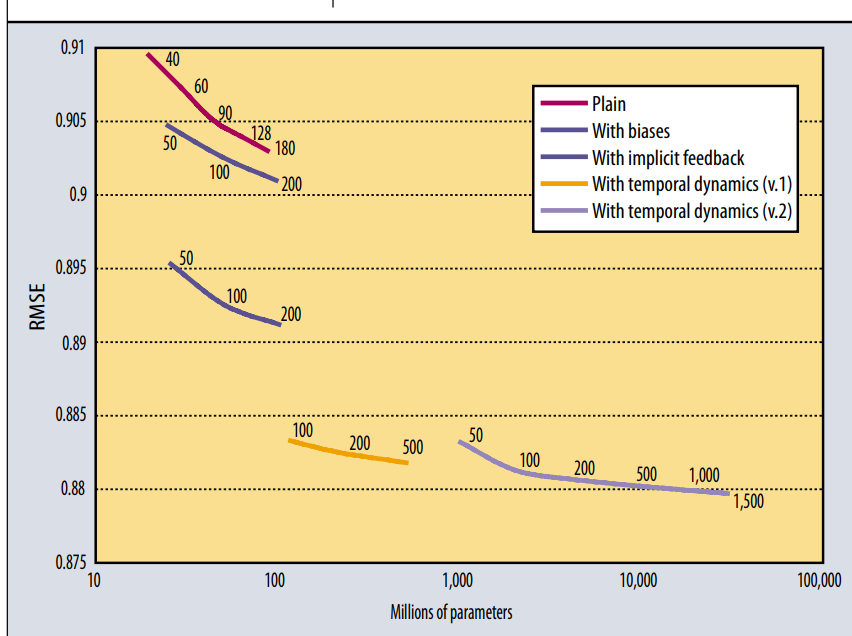

Observations from the visualization are,
- The plain model does not improve beyond a certain point, as the number of parameters increase.
- An improvement is seen by simply adding biases.
- Another technique called "Implicit Feedback" shows a big improvement.
- Temporal dynamics showed the most significant improvement in the RMSE score.

### Consider that you are working at YouTube, how will you build a time-sensitive recommendation system?
- Idea 1: The parameters, $b_u$, $b_i$, $q_i$, $p_i$ can be updated periodically. This is very much a valid approach.
- Idea 2: A higher weightage is given to a more recent data,
    - Formulation becomes, $\min_{p_u, p_i, \mu, b_u, b_i} \sum_{u, i}w_{ui}(r_{ui} - μ - b_u - b_i - q_i^T.p_u)^2 + \lambda * \sum(||q_i||^2 + ||p_u||^2 + \mu^2 + b_u^2 + b_i^2)$
    - Here w_ui represents a matrix containing weights. It is constructed in such a way that more recent the value, more is the weightage.

##### How does this work?
Suppose that a user is watching a video v_100, then the recommendations see are,
- Based on recency,
    - This can be achieved by finding the K Nearest Neighbors to a video v_100. This haas to be very fast.
- Based on historical taste,
    - Everything is precomputed offline (at night) as a batch process (at regular intervals), and more importance is given to recent data (watch history). This can be found purely through matrix factorization.
    - Every night, matrix factorzation is performed by giving more importance to the d-dimensional item vectors and the item bias (q_i, b_i).
    - Once matrix factorization is performed nightly, the top 100 videos that are good to recommend are taken based on the user's history.

# Feature Engineering using Matrix Factorization
### For Entries
Consider the Netflix usecase, there are 2 entries,
- user
- movies

In matrix factorization bed recommendation system for Netflix, the goal is to complete a rating matrix R where rows represent users and columns represent movies. To achieve this, the system learns d-dimensional user and item vectors, denoted as $p_u$ and $q_i$ respectively. These vectors capture latent features or characteristics of users and movies that influence their ratings.

#### How is matrix factorization performing feature engineering?
- Implicit Feature Learning: Matrix factorization implicity learns meaningful features for users and items. The $p_u$ vectors represent the latent preferences and characteristics of users u, while $q_i$ vector represent the latent attributes and qualities of movie i.
- User Feature Similarity: Users with similar preferences and characteristics will have $p_u$ vectors that are close to each other in the d-dimensionl space. This implies that these users are likely to have similar ratings for movies.
- Item Feature Similarity: Movies with similar genres, themes, or content will have $q_i$ vectors that are close to each other. This suggests that users who enjoy one movie may also enjoy similar movies.

The learned $p_u$ and $q_i$ vectors can be used as features for various ML tasks,
- Classification: Classify users or items based on their latent features.
- Regression: Predict continuous values, such as user ratings or movie popularity.
- Visualization: Visualize users and items in a lower-dimensional space to identify patterns and relationships.
- Clustering: Group users or items based on their similarity in the latent space.

#### What information do these features store?
Consider the user vector $p_u$. Traditionally, when feature engineering is performed, the features are represented as,
- what country is the user from?
- what is the pin code? etc.

These features have a certain meaning or interpretability about them.

But in case of feature engineering using matrix factorization a d-dimensional representation of the user is obtained, and these do not hold any kind of interpretable information, as they are algorithmically engineered.

Although there is no interpretability, these can still be visualized using UMAP or t-SNE techniques

Consider the world of e-commerce for example, the recommender systems team can compute user and item vectors $p_u$ and $q_i$ using their data matrix, and store it in a feature store. This data could be sales data/ purchase data/ number of times page visited data, etc.

#### What is a feature store?
Majorly used in big companies, feature store is a key-value fashion of storing data. Using this, when a user_id is entered, the d-dimensional representation of the user $p_u$ can be obtained. This can also be used to obtain the item vector $q_i$ for a given item_id.

Suppose that somebody searches for "bluetooth earphones", it is the task of the search team to take all of the item vectors that were built by the recommendation system tem and use it to improve the search results.

#### How can the search team improve their search results?
Suppose that a product was displayed as the first most relevant result. The search team can just find all the similar items to this product and return those using K Nearest Neighbors.

#### Can this data be used in othet context or use cases?
Yes. The matrix factorzation derived features can be used in various applications,
- Search: Improving search results by finding similar items based on their latent representations.
- Advertising: Personalized ad recommendations based on user preferences and item characteristics.
- Customer Segmentation: Grouping users based on their similarity in the latent space.

### For Text Data
#### How is the data represented? (Representing text data as a matrix)
To represent a large corpus of text data, a matrix A can be created, where,
- Each row represents a document (e.g., a Wikipedia article).
- Each column represents a unique word in the corpus.
- The value Aᵢⱼ represents the frequency or count of word j in document i.

This matrix will have dimensions n x m, where n is the number of documents and m is the number of unique words.

#### How can this data representation be used to obtain a d-dimensional representation for a word j? (Obtaining word embeddings through matrix factorization)
To obtain a d-dimensional representation for each word, we can decompose the matrix A into the product of two matrices:

$A_{nxm} = B_{nxd} * C_{dxm}$

Where,
- $B_{nxd}$ = A matrix representing the d-dimensional latent features of the documents.
- $C_{dxm}$ = A matrix representing the d-dimensional latent features of the words.

The j-th column of matrix C becomes the d-dimensional representation of word $W_j$. These representations are often referred to as word embeddings.

#### Applications of this representation (Applications of word embeddings)
Word embeddings obtained through matrix factorization can be used for various tasks, including,
- Document Similarity: By comparing the d-dimensional document vectors, we can find similar documents. This is useful for recommendation systems, document clustering, and information retrieval.
- Word Similarity: By comparing the d-dimensional word vectors, we can find similar words. This is useful for tasks like word analogy, synonym finding, and text generation.
- Natural Language Processing Tasks: Word embeddings can be used as input to various natural language processing tasks, such as sentiment analysis, machine translation, and question answering.

### Co-occurrence Matrix Approach
A co-occurrence matrix X is a square matrix of dimensions `mxm`, where m is the total number of unique words in a corpus. The element $X_{ij}$ represents the frequency with which word $W_j$ appears within a specified context of word $W_i$.

#### Contextual Neighborhood
The "context" of a word can be defined in various ways, but a common approach is to consider a fixed window size around the word. Words within this window are considered to be in the context of the target word.

For example, if the window size is 10, then words that are within 10 positions (before or after) the target word are considered to be in its context.

#### Matrix Factorization
Since the co-occurrence matrix X is square and symmetric, it can be decomposed using matrix factorization techniques, such as Singular Value Decomposition (SVD) or Non-Negative Matrix Factorization (NMF).

#### Decomposition
$X_{mxm} = B_{mxd} * C_{dxm}$

Where,
- B is a matrix with dimension `mxd` representing the latent semantic features of the words.
- C is a matrix with dimension `dxm` representing the weights of these features for each word.
- d is the latent dimensionality, or the number of hidden factors.

#### Interpretation of B and C
The B and C matrices provide a lower-dimensional representation of the words, capturing the semantic relationships between them. Each row in B represents a word, and each column represents a latent semantic feature. Similarly, each row in C represents a latent semantic feature, and each column represents a word.

### Truncated SVD
When decomposing a large co-occurrence matrix using Singular Value Decomposition (SVD), the computation can be computationally expensive due to the large number of singular values. Additionally, many of these singular values may have minimal impact on the decomposition.

Truncated SVD addresses these issues by:
1. Selecting Top Singular Values: Identify a value k such that the singular values beyond s_k are negligible. This reduces the computational complexity without sacrificing significant information.
2. Reducing Matrix Dimensions: Truncate the singular value matrix $\Sigma$ to $\bar{\Sigma_{kxk}}$, keeping only the top k singular values.
3. Truncating Singular Vectors: Similarly, truncate the left and right singular matrices U and V.T to $\bar{U_{mxk}}$ and $\bar{V_{{kxm}}^T}$, respectively.

#### New Decomposition
The truncated SVD decomposition becomes:

$X_{mxm} ≈ \bar{U_{mxk}} * \bar{\sigma_{kxk}} * \bar{V_{{kxm}}^T}$

#### Obtaining Word Vectors
The word vector for a word $W_j$ is the j-th row of the truncated left singular matrix $\bar{U_{mxk}}$.

#### Practical Considerations
- Computational Efficiency: Even with truncated SVD, the computation can be expensive for very large co-occurrence matrices.
- Word Selection: To further reduce computational cost, consider using only the top n words based on their IDF scores in TF-IDF.

### For Images: Eigen Faces
#### Image Representation
- Pixel Matrix: Images are represented as 2D matrices, with each pixel corresponding to a value.
- Vectorization: The 2D matrix is flattened into a 1D vector, representing the image as a high-dimensional feature vector.
- Data Matrix: A data matrix X is created, where each row represents an image and each column corresponds to a pixel value.

#### PCA for Face Recognition
1. Covariance Matrix: Calculate the covariance matrix S of the data matrix X.
2. Eigenvalue Decomposition: Decompose the covariance matrix into its eigenvectors W and eigenvalues λ.
3. Dimensionality Reduction: Select the top k eigenvectors (eigenfaces) corresponding to the largest eigenvalues.
4. Projection: Project the original images onto the subspace spanned by the eigenfaces to obtain their k-dimensional representations.

#### Obtaining k-Dimensional Representation
- Matrix Multiplication: Multiply the data matrix X by the matrix of eigenfaces $W_k$ to obtain the projected data $\bar{A}$.
- k-Dimensional Vectors: Each row of $\bar{A}$ represents a k-dimensional vector representing the corresponding image.

#### Reconstructing Images
- Inverse Projection: To reconstruct an image from its k-dimensional representation, multiply $\bar{A}$ by the transpose of $W_k$.
- Reshaping: Reshape the resulting matrix back into its original 2D image format.

#### NOTE
- While eigenfaces were a pioneering technique in face recognition, they have been largely replaced by more advanced methods like Convolutional Neural Networks (CNNs), which are better suited for handling complex image patterns and achieving higher accuracy.
- The choice of k is crucial in balancing computational efficiency and accuracy. A smaller k reduces dimensionality but may lead to information loss, while a larger k can capture more detail but increases computational cost.